In [ ]:
import warnings
warnings.simplefilter("ignore", UserWarning)

In [ ]:
!sudo apt-get install libopencv-dev python-opencv
!git clone https://github.com/mpatacchiola/deepgaze.git
!cd deepgaze && git checkout 2.0 && sudo python setup.py install

!pip install pyyaml==5.1 gdown

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libopencv-dev is already the newest version (3.2.0+dfsg-4ubuntu0.1).
The following NEW packages will be installed:
  python-opencv
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 535 kB of archives.
After this operation, 2,944 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 python-opencv amd64 3.2.0+dfsg-4ubuntu0.1 [535 kB]
Fetched 535 kB in 0s (6,260 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Sele

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import torch
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from google.colab import files

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from matplotlib import pyplot as plt

from deepgaze.saliency_map import FasaSaliencyMapping 
from google.colab.patches import cv2_imshow

In [ ]:
plt.rcParams['figure.figsize'] = [18, 5]

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('LVISv0.5-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_1x.yaml'))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('LVISv0.5-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_1x.yaml')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1
predictor = DefaultPredictor(cfg)

classes = MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes

model_final_5e3439.pkl: 456MB [00:37, 12.3MB/s]                           


In [ ]:
def get_saliency(image):
    # for each image the same operations are repeated
    my_map = FasaSaliencyMapping(image.shape[0], image.shape[1])  # init the saliency object
    image = my_map.returnMask(image, tot_bins=8, format='BGR2LAB')  # get the mask from the original image
    image = cv2.GaussianBlur(image, (3,3), 1)  # applying gaussin blur to make it pretty
    return image


In [ ]:
# get test dataset
!gdown https://drive.google.com/uc?id=1RJLrikeIfhBIERgh0jAhnRbV5VplO_9k
!unzip -q rgb.zip

Downloading...
From: https://drive.google.com/uc?id=1RJLrikeIfhBIERgh0jAhnRbV5VplO_9k
To: /content/rgb.zip
100% 1.16G/1.16G [00:06<00:00, 188MB/s]


In [ ]:
allowed_classes = { 12: 'apple', 343: 'cube', 1035: 'stockings_(leg_wear)',    298: 'computer_keyboard',  23: 'trash_can',  40: 'ball',  56: 'baseball',  62: 'basketball',  125: 'book',  128: 'booklet',  132: 'bottle',  176: 'butter',  193: 'can',  326: 'crate',  346: 'cup',  348: 'cupcake',  471: 'football_(American)',  588: 'icecream',  648: 'lemon',  654: 'lightbulb',  735: 'notebook',  845: 'pop_(soda)',  867: 'pumpkin',  911: 'plastic_bag',  925: 'sandwich',  932: 'scale_(measuring_instrument)',  996: 'soccer_ball',  1001: 'softball',  1080: 'tape_(sticky_cloth_or_paper)',  1097: 'tennis_ball',  1118: 'tomato',  1168: 'volleyball',  793: 'pencil',  87: 'bell_pepper', 792: 'pen', 445: 'file_(tool)', 957: 'shaving_cream', 852: 'potato', 1066: 'syringe', 745: 'onion', 391: 'doughnut', 746: 'orange_(fruit)', 196: 'candle', 941: 'screwdriver', 667: 'lotion', 1226: 'yogurt', 681: 'marker', 421: 'egg', 462: 'flashlight', 1122: 'toothpaste', 1121: 'toothbrush', 995: 'soap', 594: 'igniter', 84: 'beer_can', 1183: 'water_bottle', 952: 'shampoo', 624: 'knife', 694: 'medicine', 656: 'lime', 788: 'pear', 311: 'edible_corn', 44: 'banana', 1229: 'zucchini', 622: 'kiwi_fruit', 811: 'pickle', 25: 'asparagus', 514: 'gourd', 285: 'coconut', 27: 'avocado', 786: 'peach', 677: 'mandarin_orange', 243: 'cherry', 818: 'pineapple', 304: 'cookie', 220: 'carrot', 516: 'grape'}

In [ ]:
def get_segmentation(image, predictor, enable_whitelist):
  outputs = predictor(image)

  allowed = [(i, x.item()) for i, x in enumerate(outputs['instances'].pred_classes) if x.item() in allowed_classes]
  disallowed = [(i, x.item()) for i, x in enumerate(outputs['instances'].pred_classes) if x.item() not in allowed_classes]

  result = np.zeros(outputs["instances"].pred_masks[0].shape)
  n_classes = len(outputs["instances"].pred_masks)

  # remove me
  if not enable_whitelist:
    allowed += disallowed

  min_border = 30
  instances_n = len(allowed)
  modifier = (255 - min_border) // (instances_n + 1)
  for i, (x, c) in enumerate(allowed):
    color = (i+1) * modifier
    result[outputs["instances"].pred_masks[x].cpu()] = min_border + color

  return result

In [ ]:
def vis(thresh, image_name, enable_whitelist = True):
  cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = thresh
  predictor = DefaultPredictor(cfg)

  image = cv2.imread(image_name)

  grayscale_result = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  saliency_result = get_saliency(image)
  segmentation_result = get_segmentation(image, predictor, enable_whitelist)


  fig, axarr = plt.subplots(1, 4)
  fig.suptitle(image_name)
  axarr[0].imshow(image)
  axarr[1].imshow(grayscale_result, cmap="gray")
  axarr[2].imshow(saliency_result, cmap="gray")
  axarr[3].imshow(segmentation_result, cmap="gray")
  fig.tight_layout()
  plt.show()

In [ ]:
def vis2(thresh, image_name):
  cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = thresh
  predictor = DefaultPredictor(cfg)
  image = cv2.imread(image_name)
  outputs = predictor(image)

  v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
selected_pictures = [
  'rgb0002.png', 'rgb0013.png', 'rgb0032.png', 'rgb0049.png',
  'rgb0059.png', 'rgb0088.png', 'rgb0109.png', 'rgb0125.png',
  'rgb0156.png', 'rgb0168.png', 'rgb0195.png', 'rgb0214.png',
  'rgb0268.png', 'rgb0675.png', 'rgb0688.png', 'rgb0710.png',
  'rgb0742.png', 'rgb0805.png', 'rgb0904.png', 'rgb1323.png',
  'rgb1950.png', 'rgb1991.png', 'rgb2073.png', 'rgb2120.png',
  'rgb2154.png', 'rgb2189.png', 'rgb2298.png', 'rgb2358.png'
]

In [ ]:
GLOBAL_THRESHOLD = 0.015

In [ ]:
plt.rcParams['figure.figsize'] = [36, 10]

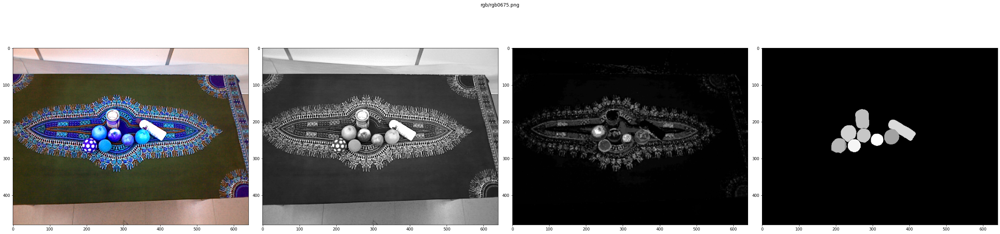

In [ ]:
# !!!
vis(0.015, 'rgb/rgb0675.png')

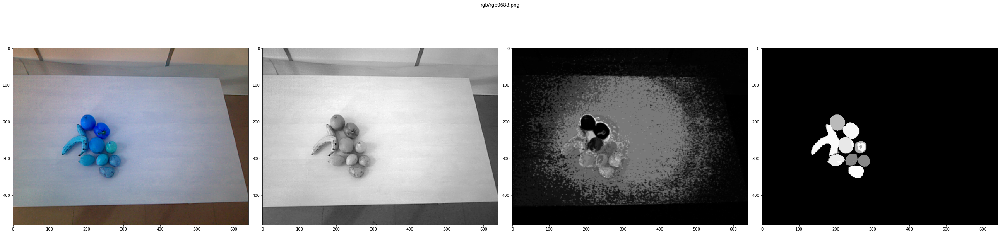

In [ ]:
# !!!
vis(0.015, 'rgb/rgb0688.png')

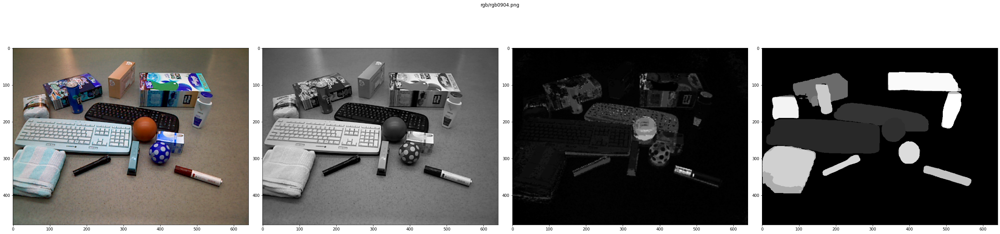

In [ ]:
# !!
vis(0.015, 'rgb/rgb0904.png')

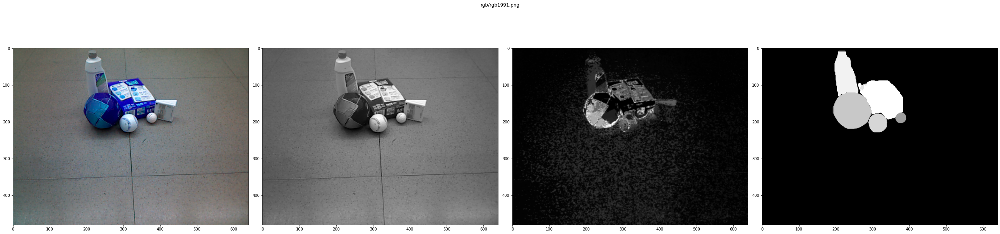

In [ ]:
# !!
vis(0.015, 'rgb/rgb1991.png')

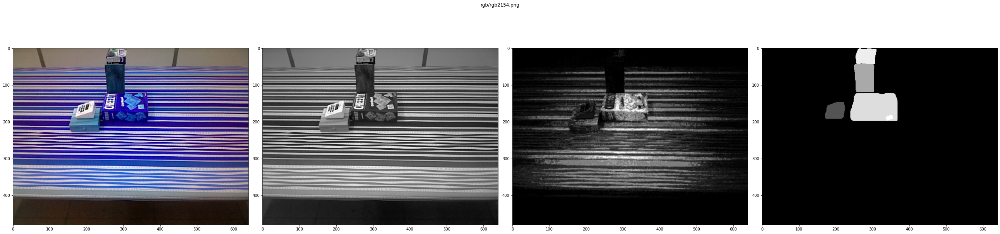

In [ ]:
# !!
vis(0.015, 'rgb/rgb2154.png')

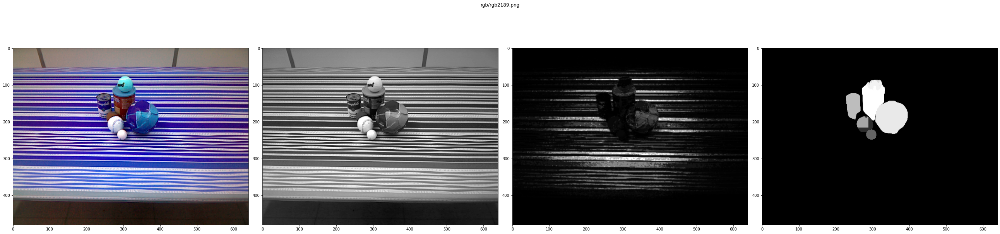

In [ ]:
# !!
vis(0.015, 'rgb/rgb2189.png')

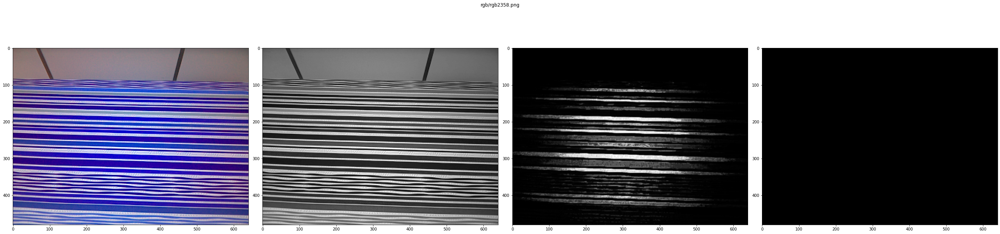

In [ ]:
# !
vis(0.015, 'rgb/rgb2358.png')

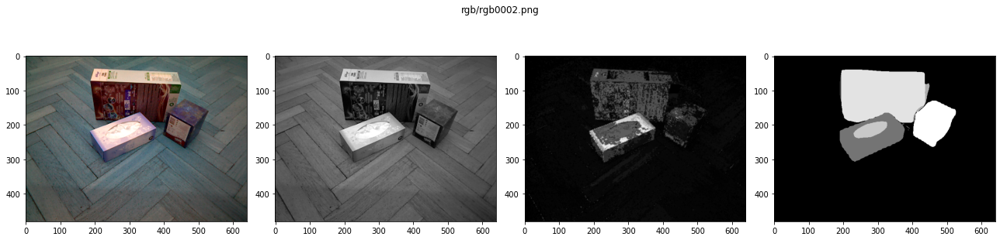

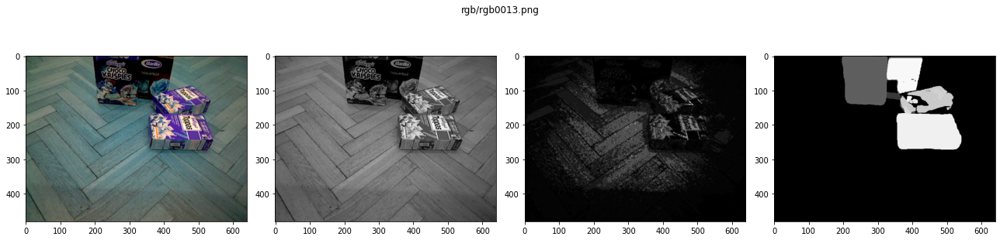

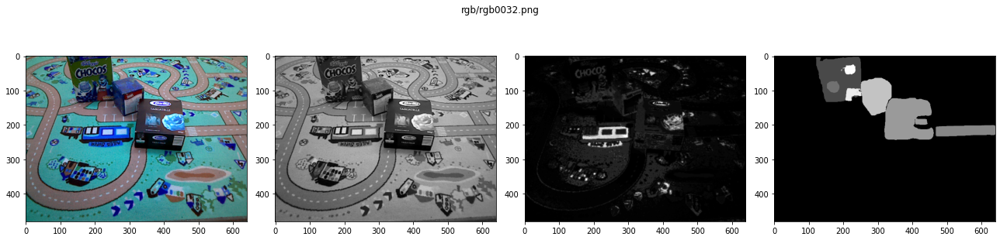

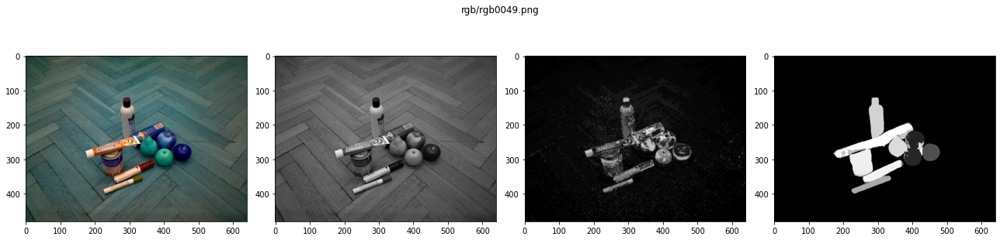

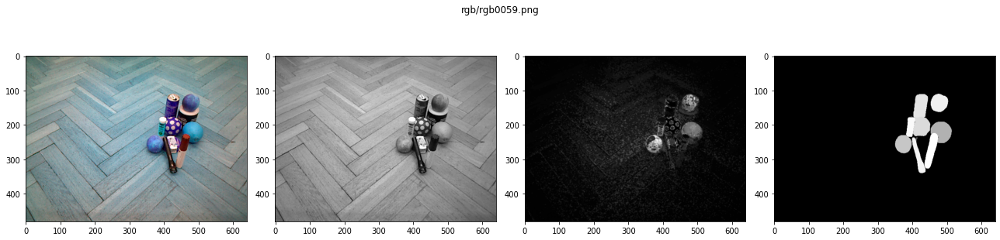

...

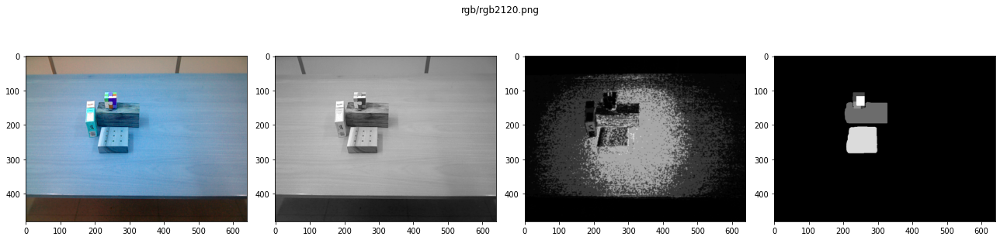

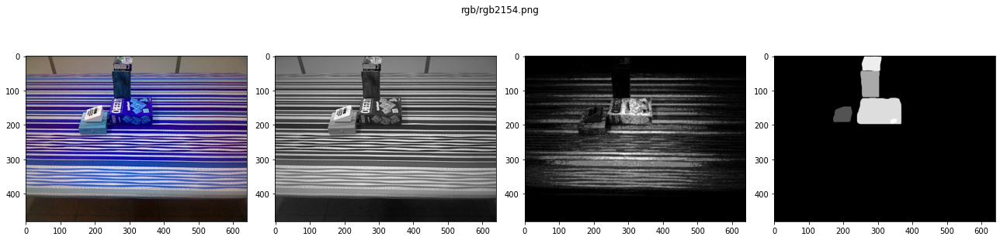

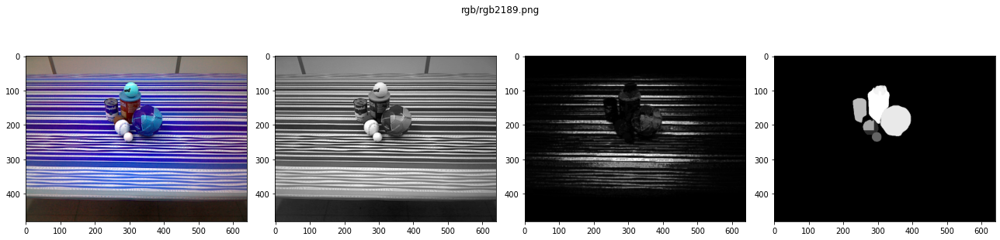

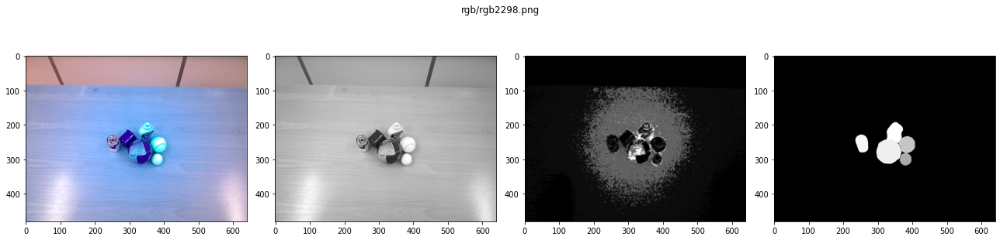

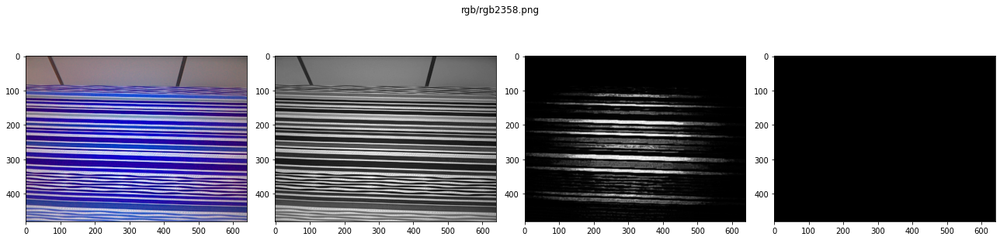

In [ ]:
plt.rcParams['figure.figsize'] = [18, 5]
for pic in selected_pictures:
  vis(GLOBAL_THRESHOLD, f'rgb/{pic}')